# **BAYBAYIN CHARACTER CLASSIFICATION**

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

#DATA PREPARATION

In [2]:
import cv2
import os.path
import imutils
from imutils import paths

In [3]:
IMG_SIZE = 32

In [4]:
def resize_to_fit(image, char_size, img_size):
    """
    A helper function to resize an image to fit within a given size
    :param image: image to resize
    :param width: desired width in pixels
    :param height: desired height in pixels
    :return: the resized image
    """

    # grab the dimensions of the image, then initialize
    # the padding values
    (h, w) = image.shape[:2]

    # if the width is greater than the height then resize along
    # the width
    if w > h:
        image = imutils.resize(image, width=char_size)

    # otherwise, the height is greater than the width so resize
    # along the height
    else:
        image = imutils.resize(image, height=char_size)

    # determine the padding values for the width and height to
    # obtain the target dimensions
    padW = int((img_size - image.shape[1]) / 2.0)
    padH = int((img_size - image.shape[0]) / 2.0)

    # pad the image then apply one more resizing to handle any
    # rounding issues
    image = cv2.copyMakeBorder(image, padH, padH, padW, padW,
        cv2.BORDER_CONSTANT,value=[255,255,255])
    image = cv2.resize(image, (img_size, img_size))

    # return the pre-processed image
    return image

In [5]:
def dataset_read(data_dir):
    # initialize the data and labels
    data = []
    labels = []

    # loop over the input images
    for image_file in paths.list_images(data_dir):
        # Load the image and convert it to grayscale
        image = cv2.imread(image_file)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        # Resize the letter so it fits in a 20x20 pixel box
        image = resize_to_fit(image, 23, IMG_SIZE)

        # Add a third channel dimension to the image to make Keras happy
        #image = image[np.newaxis]
        #image = np.expand_dims(image,3)
        image = np.expand_dims(image,axis=2)

        # Grab the name of the letter based on the folder it was in
        label = image_file.split(os.path.sep)[-1]
        if label.find("_")>0:
            labeli = label.find("_")
        else:
            labeli = label.find(".")
        label = label[0:labeli]
        label = label.casefold()

        # Add the letter image and it's label to our training data
        data.append(image)
        labels.append(label)

    return data, labels

In [6]:
def get_dataset_size(labels):
    dataset_size = np.unique(labels, return_counts=True)

    fig = plt.figure()
    ax = fig.add_axes([0,0,1,1])
    ax.bar(dataset_size[0],dataset_size[1])
    plt.show()

    print(dataset_size)

    return dataset_size

In [7]:
# Visualize the dataset

import random

def show_dataset_samples(data,labels):
    plt.rcParams['figure.figsize'] = [12, 8]

    count = 8
    fig, ax = plt.subplots(count, count)
    for i in range(count):
        for j in range(count):
            k = random.randint(0,len(labels))
            ax[i][j].imshow(np.reshape(data[k],(IMG_SIZE,IMG_SIZE)), aspect='auto', cmap='gray')
            ax[i][j].title.set_text(labels[k])
            ax[i][j].axis('off')
    
    plt.show()

    return

##IMPORTING DATASETS

###DATASET1

In [8]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [9]:
!kaggle datasets download 'jamesnogra/baybayn-baybayin-handwritten-images'

 65% 6.00M/9.29M [00:00<00:00, 58.4MB/s]
100% 9.29M/9.29M [00:00<00:00, 82.8MB/s]


In [10]:
from zipfile import ZipFile

data_dir = 'baybayn-baybayin-handwritten-images.zip'
data_dir_new = 'baybayin-char-dataset1'

with ZipFile(data_dir, 'r') as zipObj:
   listOfFileNames = zipObj.namelist()
   for fileName in listOfFileNames:
       if fileName.endswith('.jpg'):
           # Extract a single file from zipfile import ZipFile
           zipObj.extract(fileName, data_dir_new)
   print('All the images are extracted')

All the images are extracted


In [11]:
# initialize the data and labels
data1, labels1 = dataset_read(data_dir_new)

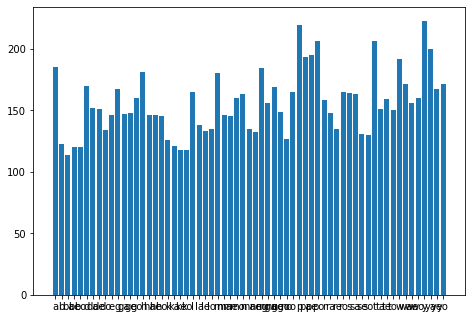

(array(['a', 'b', 'ba', 'be', 'bo', 'd', 'da', 'de', 'do', 'e', 'g', 'ga',
       'ge', 'go', 'h', 'ha', 'he', 'ho', 'k', 'ka', 'ke', 'ko', 'l',
       'la', 'le', 'lo', 'm', 'ma', 'me', 'mo', 'n', 'na', 'ne', 'ng',
       'nga', 'nge', 'ngo', 'no', 'o', 'p', 'pa', 'pe', 'po', 'r', 'ra',
       're', 'ro', 's', 'sa', 'se', 'so', 't', 'ta', 'te', 'to', 'w',
       'wa', 'we', 'wo', 'y', 'ya', 'ye', 'yo'], dtype='<U3'), array([185, 123, 114, 120, 120, 170, 152, 151, 134, 146, 167, 147, 148,
       160, 181, 146, 146, 145, 126, 121, 118, 118, 165, 138, 133, 135,
       180, 146, 145, 160, 163, 135, 132, 184, 156, 169, 149, 127, 165,
       219, 193, 195, 206, 158, 148, 135, 165, 164, 163, 131, 130, 206,
       151, 159, 150, 192, 171, 156, 160, 223, 200, 167, 171]))


In [12]:
dataset1_size = get_dataset_size(labels1)

In [13]:
num_classes1 = len(dataset1_size[1])
num_classes1

63

In [14]:
np.shape(data1[1])

(32, 32, 1)

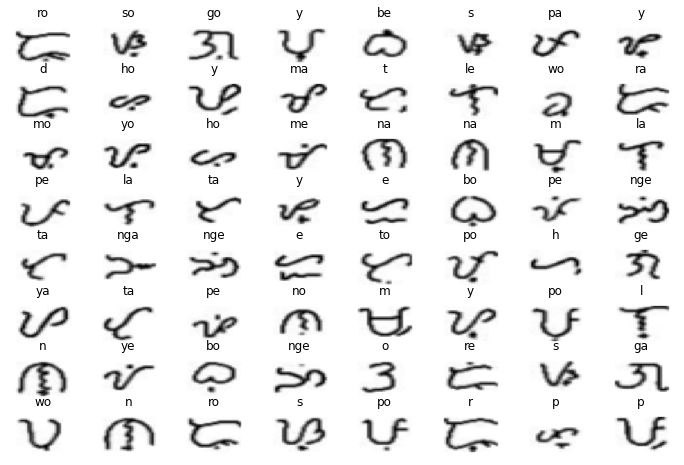

In [15]:
show_dataset_samples(data1,labels1)

###DATASET2

In [16]:
import requests

url = 'https://md-datasets-cache-zipfiles-prod.s3.eu-west-1.amazonaws.com/j6cgcfys77-1.zip'
r = requests.get(url, allow_redirects=True)

open('j6cgcfys77-1.zip', 'wb').write(r.content)

117883750

In [17]:
!unzip 'j6cgcfys77-1.zip'

Archive:  j6cgcfys77-1.zip
  inflating: Baybayin Symbol Dataset.zip  


In [18]:
!unzip 'Baybayin Symbol Dataset.zip'

Streaming output truncated to the last 5000 lines.
  inflating: original/ta/ta_01840_file138.jpg  
  inflating: original/ta/ta_01841_file139.jpg  
  inflating: original/ta/ta_01842_file139.jpg  
  inflating: original/ta/ta_01843_file139.jpg  
  inflating: original/ta/ta_01844_file139.jpg  
  inflating: original/ta/ta_01845_file140.jpg  
  inflating: original/ta/ta_01846_file140.jpg  
  inflating: original/ta/ta_01847_file140.jpg  
 extracting: original/ta/ta_01848_file142.jpg  
 extracting: original/ta/ta_01849_file142.jpg  
 extracting: original/ta/ta_01850_file142.jpg  
 extracting: original/ta/ta_01851_file142.jpg  
 extracting: original/ta/ta_01852_file143.jpg  
 extracting: original/ta/ta_01853_file143.jpg  
  inflating: original/ta/ta_01854_file144.jpg  
  inflating: original/ta/ta_01855_file146.jpg  
 extracting: original/ta/ta_01856_file146.jpg  
  inflating: original/ta/ta_01857_file146.jpg  
 extracting: original/ta/ta_01858_file146.jpg  
  inflating: original/ta/ta_01859_fil

In [19]:
data2, labels2 = dataset_read("original")

In [20]:
# rename label name 'dara' to 'da'
for i in range(len(labels2)):
    if labels2[i] == 'dara':
      labels2[i] = 'da'
    if labels2[i] == 'ei':
      labels2[i] = 'e'
    if labels2[i] == 'ou':
      labels2[i] = 'o'

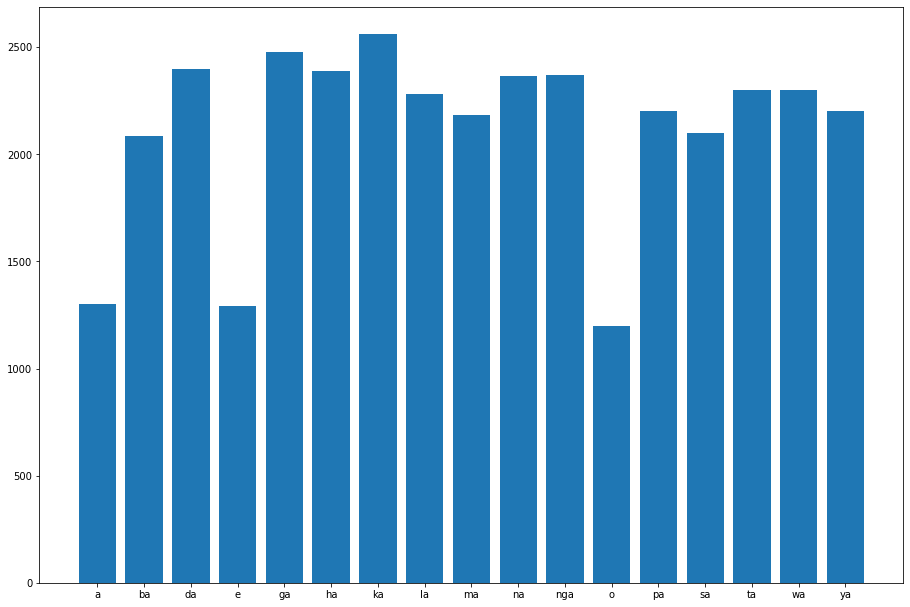

(array(['a', 'ba', 'da', 'e', 'ga', 'ha', 'ka', 'la', 'ma', 'na', 'nga',
       'o', 'pa', 'sa', 'ta', 'wa', 'ya'], dtype='<U3'), array([1300, 2085, 2400, 1290, 2475, 2390, 2560, 2280, 2185, 2365, 2370,
       1200, 2200, 2100, 2300, 2300, 2200]))


In [21]:
dataset2_size = get_dataset_size(labels2)

In [22]:
num_classes2 = len(dataset2_size[1])
num_classes2

17

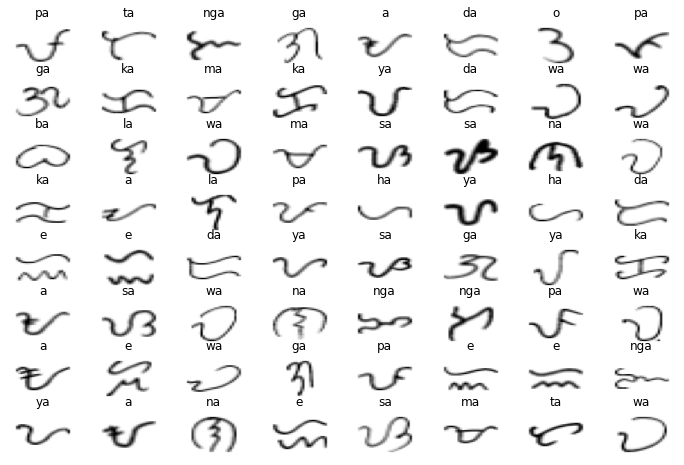

In [23]:
show_dataset_samples(data2,labels2)

###COMBINED DATASET

In [24]:
data = []
labels = []
data = np.concatenate((data1, data2), axis=0)
labels = np.concatenate((labels1, labels2), axis=0)

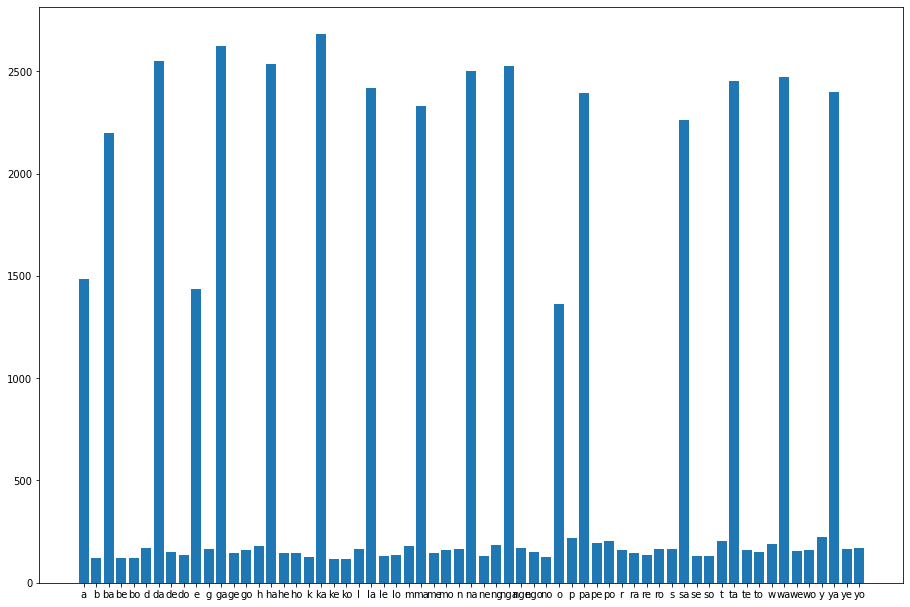

(array(['a', 'b', 'ba', 'be', 'bo', 'd', 'da', 'de', 'do', 'e', 'g', 'ga',
       'ge', 'go', 'h', 'ha', 'he', 'ho', 'k', 'ka', 'ke', 'ko', 'l',
       'la', 'le', 'lo', 'm', 'ma', 'me', 'mo', 'n', 'na', 'ne', 'ng',
       'nga', 'nge', 'ngo', 'no', 'o', 'p', 'pa', 'pe', 'po', 'r', 'ra',
       're', 'ro', 's', 'sa', 'se', 'so', 't', 'ta', 'te', 'to', 'w',
       'wa', 'we', 'wo', 'y', 'ya', 'ye', 'yo'], dtype='<U3'), array([1485,  123, 2199,  120,  120,  170, 2552,  151,  134, 1436,  167,
       2622,  148,  160,  181, 2536,  146,  145,  126, 2681,  118,  118,
        165, 2418,  133,  135,  180, 2331,  145,  160,  163, 2500,  132,
        184, 2526,  169,  149,  127, 1365,  219, 2393,  195,  206,  158,
        148,  135,  165,  164, 2263,  131,  130,  206, 2451,  159,  150,
        192, 2471,  156,  160,  223, 2400,  167,  171]))


In [25]:
dataset_size = get_dataset_size(labels)

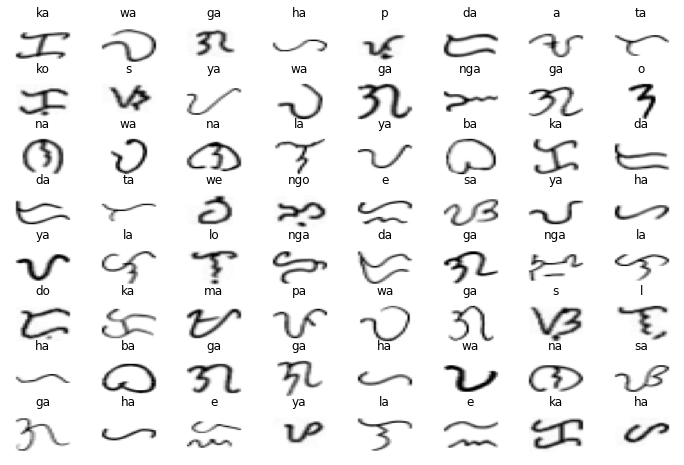

In [26]:
show_dataset_samples(data,labels)

##Preparing TRAIN & VALID Dataset

In [27]:
from sklearn.model_selection import train_test_split
(train_data, valid_data, train_label, valid_label) = train_test_split(data, labels, test_size=0.2, random_state=0
                                                                      #shuffle = True, stratify=labels
                                                                      )

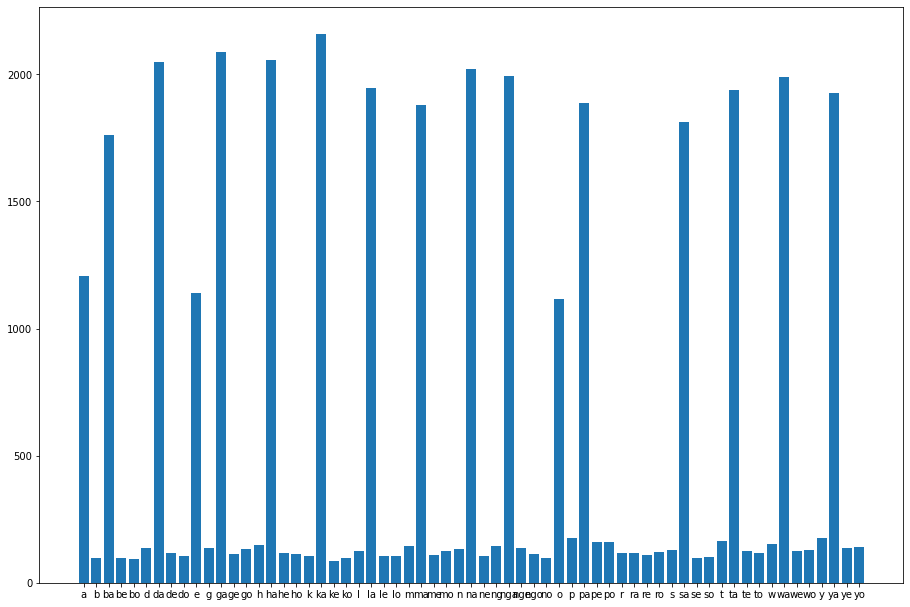

(array(['a', 'b', 'ba', 'be', 'bo', 'd', 'da', 'de', 'do', 'e', 'g', 'ga',
       'ge', 'go', 'h', 'ha', 'he', 'ho', 'k', 'ka', 'ke', 'ko', 'l',
       'la', 'le', 'lo', 'm', 'ma', 'me', 'mo', 'n', 'na', 'ne', 'ng',
       'nga', 'nge', 'ngo', 'no', 'o', 'p', 'pa', 'pe', 'po', 'r', 'ra',
       're', 'ro', 's', 'sa', 'se', 'so', 't', 'ta', 'te', 'to', 'w',
       'wa', 'we', 'wo', 'y', 'ya', 'ye', 'yo'], dtype='<U3'), array([1205,   98, 1762,   97,   94,  137, 2049,  118,  105, 1141,  137,
       2088,  115,  131,  148, 2055,  119,  112,  106, 2158,   87,   98,
        124, 1945,  104,  106,  144, 1879,  109,  125,  132, 2020,  104,
        145, 1992,  138,  115,   98, 1117,  176, 1889,  159,  159,  118,
        117,  108,  121,  128, 1812,   99,  100,  163, 1939,  126,  118,
        153, 1989,  125,  128,  178, 1927,  135,  142]))


In [28]:
train_datasize = get_dataset_size(train_label)

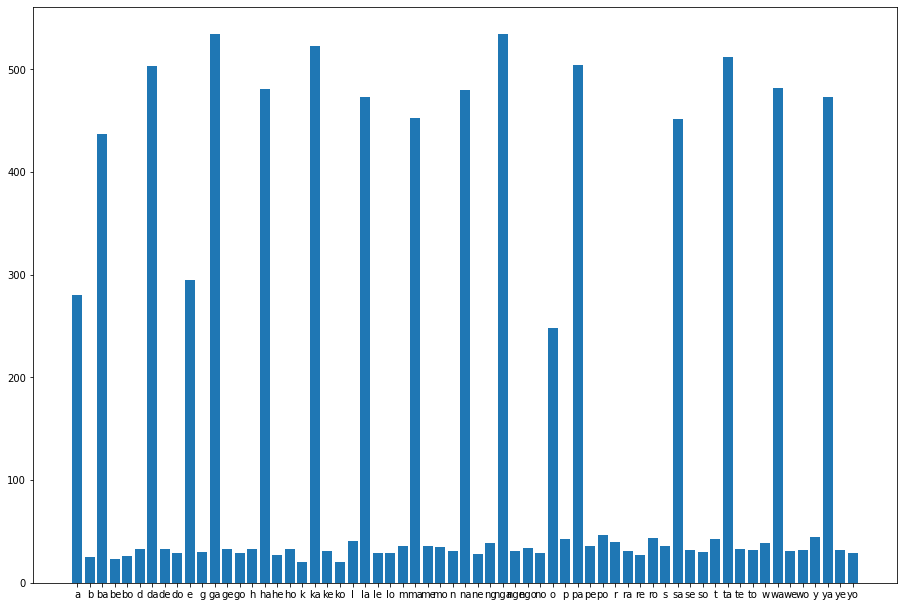

(array(['a', 'b', 'ba', 'be', 'bo', 'd', 'da', 'de', 'do', 'e', 'g', 'ga',
       'ge', 'go', 'h', 'ha', 'he', 'ho', 'k', 'ka', 'ke', 'ko', 'l',
       'la', 'le', 'lo', 'm', 'ma', 'me', 'mo', 'n', 'na', 'ne', 'ng',
       'nga', 'nge', 'ngo', 'no', 'o', 'p', 'pa', 'pe', 'po', 'r', 'ra',
       're', 'ro', 's', 'sa', 'se', 'so', 't', 'ta', 'te', 'to', 'w',
       'wa', 'we', 'wo', 'y', 'ya', 'ye', 'yo'], dtype='<U3'), array([280,  25, 437,  23,  26,  33, 503,  33,  29, 295,  30, 534,  33,
        29,  33, 481,  27,  33,  20, 523,  31,  20,  41, 473,  29,  29,
        36, 452,  36,  35,  31, 480,  28,  39, 534,  31,  34,  29, 248,
        43, 504,  36,  47,  40,  31,  27,  44,  36, 451,  32,  30,  43,
       512,  33,  32,  39, 482,  31,  32,  45, 473,  32,  29]))


In [29]:
valid_datasize = get_dataset_size(valid_label)

###BALANCING DATA
https://www.analyticsvidhya.com/blog/2021/06/5-techniques-to-handle-imbalanced-data-for-a-classification-problem/

In [30]:
from sklearn.utils import resample

def dataset_balancing(data,labels,size):
    dat = []
    lbl = []

    datasize = np.unique(labels, return_counts=True)

    for letter in datasize[0]:
        df = data[(labels==letter)]
        df_sampled = resample(df, 
                              replace=True,    # sample with replacement
                              n_samples= size, # to match majority class
                              random_state=42)
        for i in range(len(df_sampled)):
            dat.append(df_sampled[i])
            #data = np.append(df_sampled[i])
        lbl_sampled = np.repeat(letter,size)
        #labels.append(lbl_sampled)
        lbl = np.concatenate((lbl,lbl_sampled), axis=0)

    dat = np.array(dat)
    lbl = np.array(lbl)

    return dat, lbl

####Train Dataset

In [31]:
train_size = 400
train_data, train_label = dataset_balancing(train_data,train_label,train_size)

In [32]:
train_data.shape

(25200, 32, 32, 1)

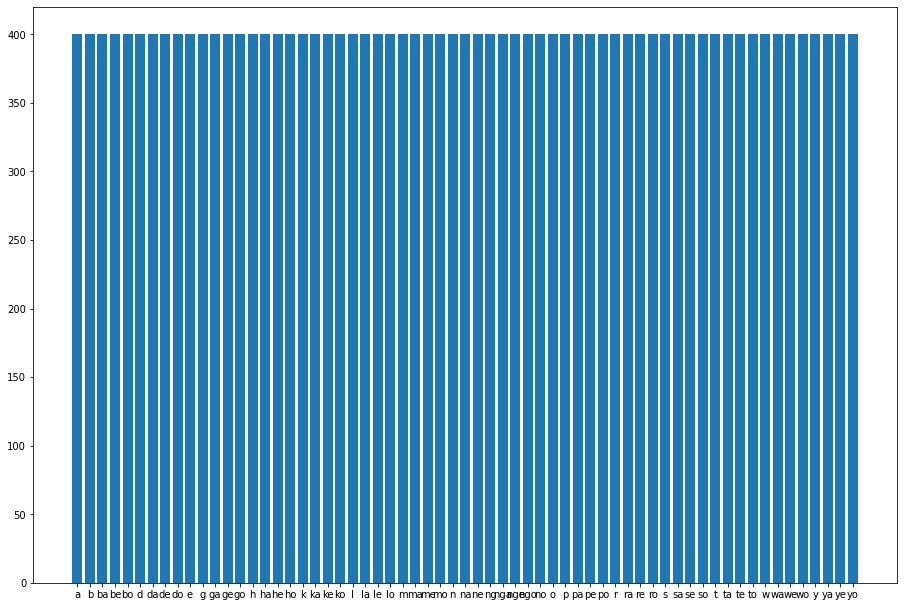

(array(['a', 'b', 'ba', 'be', 'bo', 'd', 'da', 'de', 'do', 'e', 'g', 'ga',
       'ge', 'go', 'h', 'ha', 'he', 'ho', 'k', 'ka', 'ke', 'ko', 'l',
       'la', 'le', 'lo', 'm', 'ma', 'me', 'mo', 'n', 'na', 'ne', 'ng',
       'nga', 'nge', 'ngo', 'no', 'o', 'p', 'pa', 'pe', 'po', 'r', 'ra',
       're', 'ro', 's', 'sa', 'se', 'so', 't', 'ta', 'te', 'to', 'w',
       'wa', 'we', 'wo', 'y', 'ya', 'ye', 'yo'], dtype='<U32'), array([400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400,
       400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400,
       400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400,
       400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400,
       400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400]))


In [33]:
train_datasize = get_dataset_size(train_label)

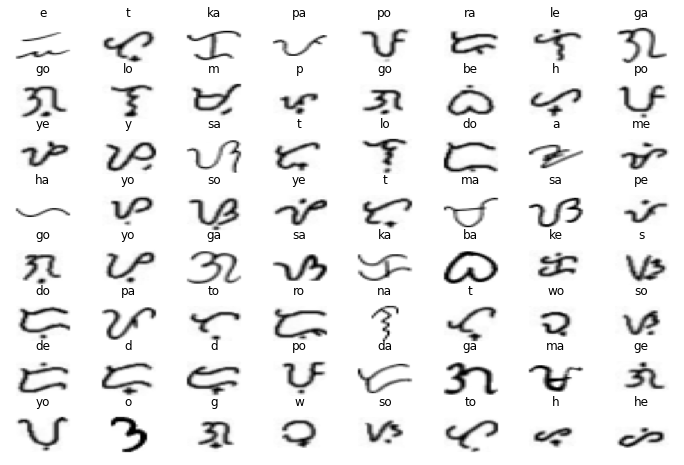

In [34]:
show_dataset_samples(train_data,train_label)

In [35]:
valid_size = 100

valid_data, valid_label = dataset_balancing(valid_data,valid_label,valid_size)

In [36]:
valid_data.shape

(6300, 32, 32, 1)

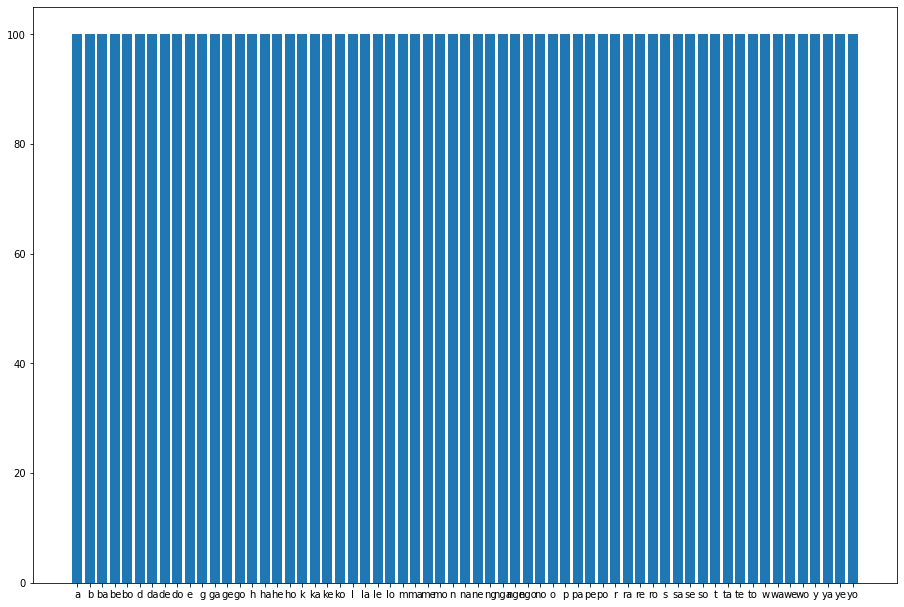

(array(['a', 'b', 'ba', 'be', 'bo', 'd', 'da', 'de', 'do', 'e', 'g', 'ga',
       'ge', 'go', 'h', 'ha', 'he', 'ho', 'k', 'ka', 'ke', 'ko', 'l',
       'la', 'le', 'lo', 'm', 'ma', 'me', 'mo', 'n', 'na', 'ne', 'ng',
       'nga', 'nge', 'ngo', 'no', 'o', 'p', 'pa', 'pe', 'po', 'r', 'ra',
       're', 'ro', 's', 'sa', 'se', 'so', 't', 'ta', 'te', 'to', 'w',
       'wa', 'we', 'wo', 'y', 'ya', 'ye', 'yo'], dtype='<U32'), array([100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100,
       100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100,
       100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100,
       100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100,
       100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100]))


In [37]:
valid_datasize = get_dataset_size(valid_label)

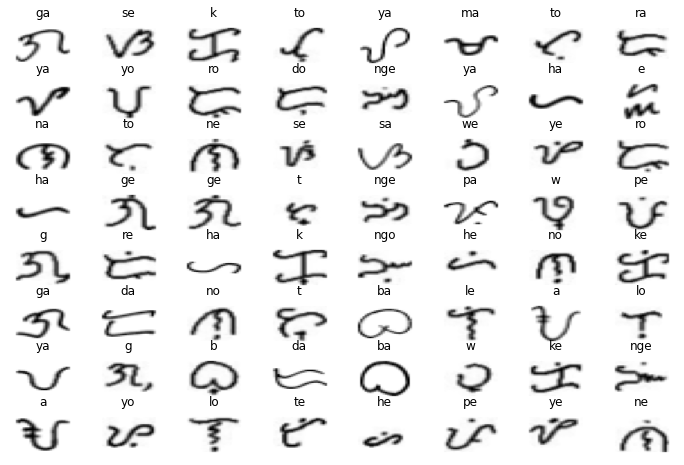

In [38]:
show_dataset_samples(valid_data,valid_label)

#PREPROCESSING

In [39]:
train_data = (255-train_data.astype('float32')) / 255
valid_data = (255-valid_data.astype('float32')) / 255

##Label Coding
Convert class names to int

In [40]:
label_code = []
for i in range(len(train_datasize[0])):
    label_code.append([i,train_datasize[0][i]])
label_code = np.array(label_code)
label_code

array([['0', 'a'],
       ['1', 'b'],
       ['2', 'ba'],
       ['3', 'be'],
       ['4', 'bo'],
       ['5', 'd'],
       ['6', 'da'],
       ['7', 'de'],
       ['8', 'do'],
       ['9', 'e'],
       ['10', 'g'],
       ['11', 'ga'],
       ['12', 'ge'],
       ['13', 'go'],
       ['14', 'h'],
       ['15', 'ha'],
       ['16', 'he'],
       ['17', 'ho'],
       ['18', 'k'],
       ['19', 'ka'],
       ['20', 'ke'],
       ['21', 'ko'],
       ['22', 'l'],
       ['23', 'la'],
       ['24', 'le'],
       ['25', 'lo'],
       ['26', 'm'],
       ['27', 'ma'],
       ['28', 'me'],
       ['29', 'mo'],
       ['30', 'n'],
       ['31', 'na'],
       ['32', 'ne'],
       ['33', 'ng'],
       ['34', 'nga'],
       ['35', 'nge'],
       ['36', 'ngo'],
       ['37', 'no'],
       ['38', 'o'],
       ['39', 'p'],
       ['40', 'pa'],
       ['41', 'pe'],
       ['42', 'po'],
       ['43', 'r'],
       ['44', 'ra'],
       ['45', 're'],
       ['46', 'ro'],
       ['47', 's'],
       ['48',

In [41]:
def label_coding(label,lbl_code=label_code):
    label_coded = []
    for letter in label:
        label_coded.append(lbl_code.T[0][np.where(lbl_code.T[1]==letter)])
    label_coded = np.array(label_coded)

    return label_coded

In [42]:
train_label = label_coding(train_label)
train_label

array([['0'],
       ['0'],
       ['0'],
       ...,
       ['62'],
       ['62'],
       ['62']], dtype='<U21')

In [43]:
train_label_round = train_label

In [44]:
valid_label = label_coding(valid_label)
valid_label

array([['0'],
       ['0'],
       ['0'],
       ...,
       ['62'],
       ['62'],
       ['62']], dtype='<U21')

In [45]:
valid_label_round = valid_label

##One-Hot Coding

In [46]:
import tensorflow.keras as keras
num_classes = len(train_datasize[0])

train_label = keras.utils.to_categorical(train_label, num_classes)
valid_label = keras.utils.to_categorical(valid_label, num_classes)

In [47]:
train_label

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

In [48]:
valid_label

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

##DATA AUGMENTATION

In [49]:
# Visualize the dataset

import random

def show_dataset_samples_aug(data,labels):
    plt.rcParams['figure.figsize'] = [12, 8]

    count = 8
    fig, ax = plt.subplots(count, count)
    for i in range(count):
        for j in range(count):
            k = random.randint(0,len(labels))
            augmented_image = data_augmentation(tf.expand_dims(data[k], 0))
            ax[i][j].imshow(np.reshape(augmented_image,(IMG_SIZE,IMG_SIZE)), aspect='auto', cmap='gray')
            ax[i][j].title.set_text(label_code.T[1][(int)(labels[k])])
            ax[i][j].axis('off')
    
    plt.show()

    return

In [50]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomRotation(0.08),
  tf.keras.layers.RandomTranslation(0.1,0.1,fill_mode='constant'),
  tf.keras.layers.RandomContrast(0.1),
  tf.keras.layers.RandomZoom((-0.05,0.5),width_factor=(-0.05,0.5), fill_mode='constant')
])

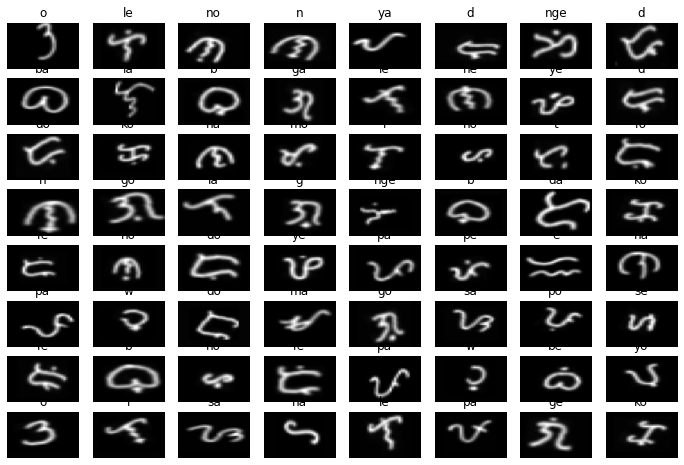

In [51]:
show_dataset_samples_aug(valid_data,valid_label_round)

#MODEL

In [52]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    Dense,
    Conv2D,
    MaxPool2D,
    AveragePooling2D,
    Flatten,
    Dropout,
    BatchNormalization,
    DepthwiseConv2D,
    GlobalAveragePooling2D,
    ReLU,
    add
)
from tensorflow.keras import layers
from tensorflow import keras

##MODEL LAYERS

In [53]:
def expansion_block(x,t,filters,block_id):
    prefix = 'block_{}_'.format(block_id)
    total_filters = t*filters
    x = Conv2D(total_filters,1,padding='same',use_bias=False, name =    prefix +'expand')(x)
    x = BatchNormalization(name=prefix +'expand_bn')(x)
    x = ReLU(6,name = prefix +'expand_relu')(x)
    return x
def depthwise_block(x,stride,block_id):
    prefix = 'block_{}_'.format(block_id)
    x = DepthwiseConv2D(3,strides=(stride,stride),padding ='same', use_bias = False, name = prefix + 'depthwise_conv')(x)
    x = BatchNormalization(name=prefix +'dw_bn')(x)
    x = ReLU(6,name = prefix +'dw_relu')(x)
    return x
def projection_block(x,out_channels,block_id):
    prefix = 'block_{}_'.format(block_id)
    x = Conv2D(filters=out_channels,kernel_size = 1,   padding='same',use_bias=False,name= prefix + 'compress')(x)
    x = BatchNormalization(name=prefix +'compress_bn')(x)
    return x

def Bottleneck(x,t,filters, out_channels,stride,block_id):
    y = expansion_block(x,t,filters,block_id)
    y = depthwise_block(y,stride,block_id)
    y = projection_block(y, out_channels,block_id)
    if y.shape[-1]==x.shape[-1]:
       y = add([x,y])
    return y

In [55]:
input_shape = (32,32,1)
input = tf.keras.Input(input_shape)
x = data_augmentation(input)
x = Conv2D(32,3,strides=(2,2),padding='same', use_bias=False)(x)
x = BatchNormalization(name='conv1_bn')(x)
x = ReLU(6, name='conv1_relu')(x)
# 17 Bottlenecks
x = depthwise_block(x,stride=1,block_id=1)
x = projection_block(x, out_channels=16,block_id=1)
x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 24, stride = 2,block_id = 2)
x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 24, stride = 1,block_id = 3)
x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 32, stride = 2,block_id = 4)
x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 32, stride = 1,block_id = 5)
x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 32, stride = 1,block_id = 6)
x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 64, stride = 2,block_id = 7)
x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 64, stride = 1,block_id = 8)
x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 64, stride = 1,block_id = 9)
x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 64, stride = 1,block_id = 10)
x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 96, stride = 1,block_id = 11)
x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 96, stride = 1,block_id = 12)
x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 96, stride = 1,block_id = 13)
x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 160, stride = 2,block_id = 14)
x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 160, stride = 1,block_id = 15)
x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 160, stride = 1,block_id = 16)
x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 320, stride = 1,block_id = 17)
x = Conv2D(filters = 1280,kernel_size = 1,padding='same',use_bias=False, name = 'last_conv')(x)
x = BatchNormalization(name='last_bn')(x)
x = ReLU(6,name='last_relu')(x)
x = GlobalAveragePooling2D(name='global_average_pool')(x)
output = Dense(num_classes,activation='softmax')(x)
model = tf.keras.Model(input, output)

In [56]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 32, 32, 1)]  0           []                               
                                                                                                  
 sequential (Sequential)        (None, 32, 32, 1)    0           ['input_2[0][0]']                
                                                                                                  
 conv2d_1 (Conv2D)              (None, 16, 16, 32)   288         ['sequential[1][0]']             
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 16, 16, 32)   128         ['conv2d_1[0][0]']               
                                                                                            

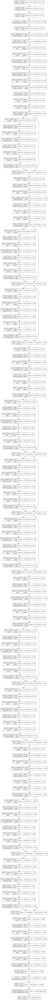

In [57]:
# Visualize the model
from IPython.display import Image
from keras.utils.vis_utils import plot_model

plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)
Image('model.png')

##Compile Model

In [58]:
# Ask Keras to build the TensorFlow model behind the scenes
#base_learning_rate = 0.0001

model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])

#model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              #loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              #metrics=['accuracy'])

#TRAINING

In [60]:
# Logging with tensorboard
tensorboard = keras.callbacks.TensorBoard(
    log_dir="./log_directory",
)

In [61]:
# Train the neural network
BATCH_SIZE = 32
NUM_EPOCHS = 50

history = model.fit(train_data, 
          train_label,
          validation_data=(valid_data, valid_label),
          batch_size=BATCH_SIZE,
          epochs=NUM_EPOCHS,
          verbose=1,
          callbacks=[tensorboard])

Epoch 1/50
788/788 [==============================] - 47s 37ms/step - loss: 3.1014 - accuracy: 0.1636 - val_loss: 2.2189 - val_accuracy: 0.2987
Epoch 2/50
788/788 [==============================] - 17s 21ms/step - loss: 1.8688 - accuracy: 0.3781 - val_loss: 1.7795 - val_accuracy: 0.4197
Epoch 3/50
788/788 [==============================] - 16s 21ms/step - loss: 1.4614 - accuracy: 0.5000 - val_loss: 1.2177 - val_accuracy: 0.5667
Epoch 4/50
788/788 [==============================] - 16s 21ms/step - loss: 1.1842 - accuracy: 0.5823 - val_loss: 1.4369 - val_accuracy: 0.5694
Epoch 5/50
788/788 [==============================] - 27s 34ms/step - loss: 1.0021 - accuracy: 0.6420 - val_loss: 0.9256 - val_accuracy: 0.6687
Epoch 6/50
788/788 [==============================] - 23s 30ms/step - loss: 0.8866 - accuracy: 0.6891 - val_loss: 0.9764 - val_accuracy: 0.6700
Epoch 7/50
788/788 [==============================] - 16s 21ms/step - loss: 0.7663 - accuracy: 0.7351 - val_loss: 0.9013 - val_accuracy:

##TRAINING vs VALIDATION PLOTS

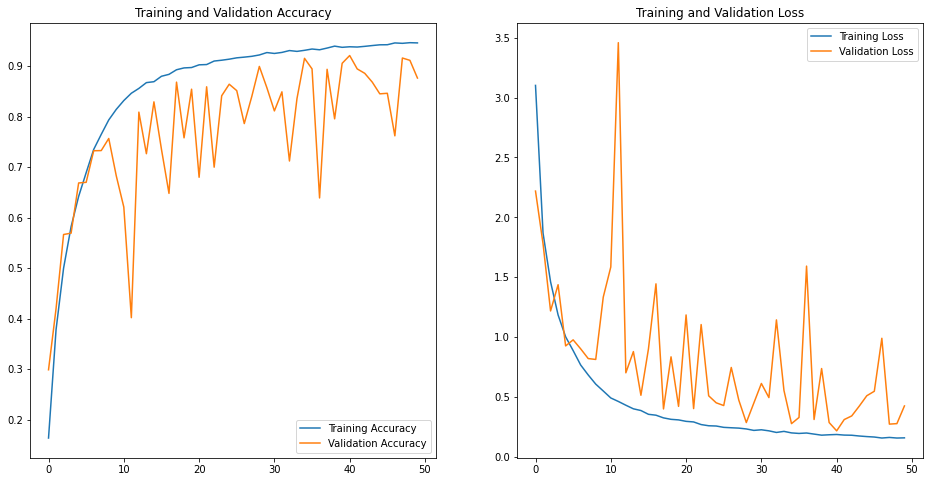

In [62]:
# Plot accuracy and loss with Matplotlib

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(NUM_EPOCHS)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [63]:
%load_ext tensorboard
%tensorboard --logdir ./log_directory

<IPython.core.display.Javascript object>

#MODEL EVALUATION & PREDICTION

In [64]:
valid_label_round = np.argmax(valid_label, axis=1)

In [65]:
test_metrics = model.evaluate(valid_data, valid_label)

197/197 [==============================] - 2s 8ms/step - loss: 0.4245 - accuracy: 0.8765


##CONFUSION MATRIX

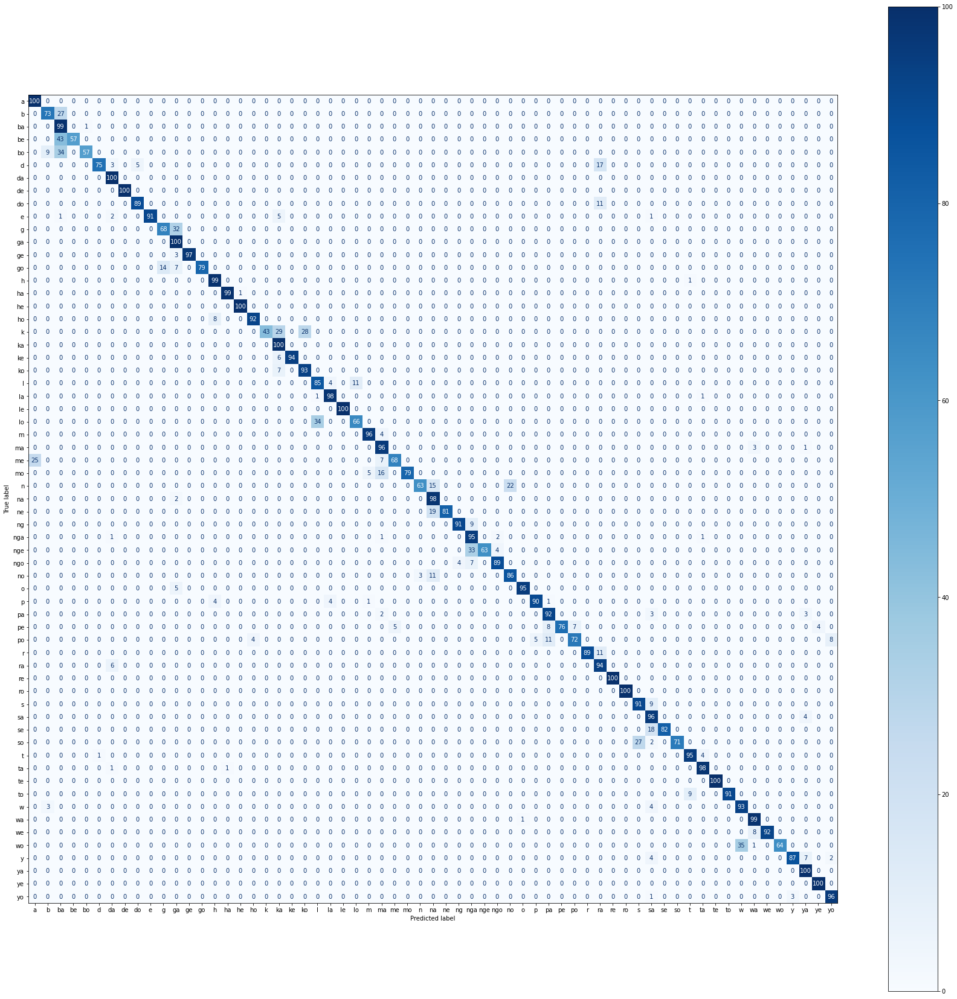

In [66]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix

test_predictions = np.argmax(model.predict(valid_data), axis=1)
cm = confusion_matrix(valid_label_round, test_predictions)
cmp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_code.T[1])

fig, ax = plt.subplots(figsize=(30,30))
#for labels in cmp.text_.ravel():
#    labels.set_fontsize(5)
cmp.plot(cmap=plt.cm.Blues,ax=ax)

##CLASSIFICATION REPORT

In [67]:
MODEL_NAME = 'BaybayinChar_MobileNetV2_zoomed'

In [68]:
from sklearn.metrics import classification_report
import pandas as pd

report = classification_report(valid_label_round, test_predictions, target_names=label_code.T[1],output_dict=True)

clsf_report = pd.DataFrame(report).transpose()
clsf_report.to_csv(MODEL_NAME + '_classification_report.csv', index= True)

clsf_report.head()

,precision,recall,f1-score,support
a,0.800000,1.00,0.888889,100.0
b,0.858824,0.73,0.789189,100.0
ba,0.485294,0.99,0.651316,100.0
be,1.000000,0.57,0.726115,100.0
bo,0.982759,0.57,0.721519,100.0


##SAMPLE TEST

In [69]:
# label mapping

def infer(image_number):
    # image_number - select the image from our test dataset
   
    plt.figure(figsize=(16, 8))
    
    # load the image in an array
    img = valid_data[image_number]

    # display the image
    plt.subplot(1, 2, 1)
    plt.imshow(np.reshape(img,(IMG_SIZE,IMG_SIZE)), cmap='gray')
    plt.colorbar()
    plt.grid(False)
    
    # reshape it
    img_reshape = np.array(img).reshape(1, IMG_SIZE, IMG_SIZE, 1)

    # pass in the network for prediction and
    pred = model.predict(img_reshape)

    x_values = range(num_classes)
    plt.subplot(1, 2, 2)
    plt.bar(x_values, pred.flatten())
    plt.xticks(x_values)  

    # save the predicted label
    predicted_label = label_code.T[1][np.argmax(pred)]
    # load the original label
    true_label = label_code.T[1][int(valid_label_round[image_number])]
    
    # display the result
    print(f"Ground truth: {true_label}; Predicted: {predicted_label}" )

    return

Ground truth: a; Predicted: a


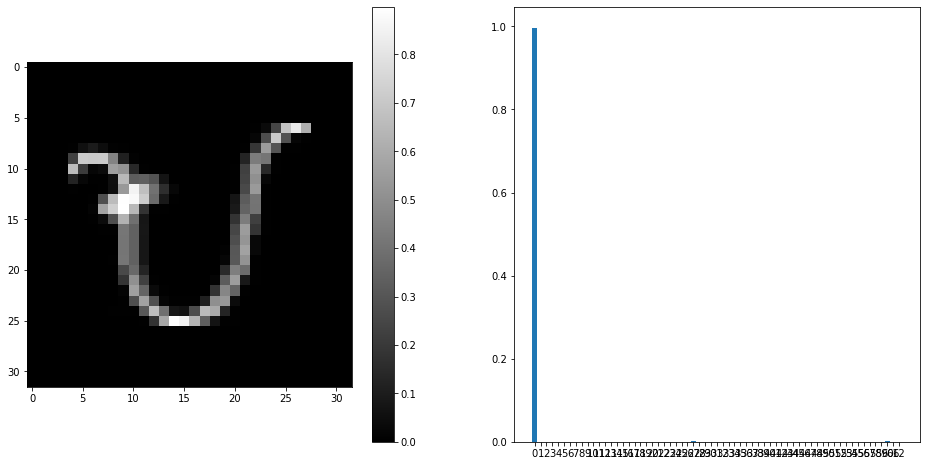

In [70]:
infer(67)

In [71]:
model.predict(valid_data[0:10])

array([[8.99525106e-01, 3.07928743e-16, 3.62852361e-08, 3.53680388e-12,
        1.00400202e-15, 3.98114616e-06, 7.23951822e-03, 7.19393165e-06,
        6.34035102e-10, 2.08773443e-07, 1.98510899e-13, 6.55378614e-08,
        6.09339409e-15, 3.31147218e-20, 2.31158790e-11, 4.24525801e-08,
        2.79543077e-12, 2.81253106e-14, 8.77516172e-14, 1.55890320e-05,
        5.03525607e-12, 1.60467149e-16, 6.74444607e-07, 1.46135071e-03,
        4.62667556e-13, 6.87664192e-09, 1.12644227e-06, 1.00283511e-02,
        1.56457169e-09, 8.88963236e-10, 1.30711527e-07, 2.34582762e-06,
        8.47365289e-10, 1.79354123e-12, 1.96244537e-06, 4.03123600e-16,
        9.53070264e-19, 1.02572235e-10, 3.65626907e-09, 1.05736326e-08,
        7.74089403e-06, 1.05186563e-12, 1.71989159e-11, 4.64774816e-11,
        6.73697897e-08, 2.08187995e-10, 3.86162196e-12, 3.16810787e-13,
        3.56053315e-05, 8.19615860e-13, 2.16961984e-14, 5.13048860e-07,
        2.51906132e-03, 2.27779580e-07, 7.27782112e-10, 5.084727

#MODEL EXPORT

In [72]:
# Convert Keras model to TF Lite format.
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

tf.lite.experimental.Analyzer.analyze(model_content=tflite_model)

# Print the signatures from the converted model
interpreter = tf.lite.Interpreter(model_content=tflite_model)

signatures = interpreter.get_signature_list()
print(signatures)

# Save the TF Lite model as file
f = open(MODEL_NAME+'_model.tflite', "wb")
f.write(tflite_model)
f.close()

INFO:tensorflow:Assets written to: /tmp/tmpzuma4476/assets


=== TFLite ModelAnalyzer ===

Your TFLite model has '1' subgraph(s). In the subgraph description below,
T# represents the Tensor numbers. For example, in Subgraph#0, the CONV_2D op takes
tensor #0 and tensor #39 and tensor #3 as input and produces tensor #108 as output.

Subgraph#0 main(T#0) -> [T#172]
  Op#0 CONV_2D(T#0, T#39, T#3) -> [T#108]
  Op#1 DEPTHWISE_CONV_2D(T#108, T#74, T#4) -> [T#109]
  Op#2 CONV_2D(T#109, T#40, T#75) -> [T#110]
  Op#3 CONV_2D(T#110, T#41, T#5) -> [T#111]
  Op#4 DEPTHWISE_CONV_2D(T#111, T#76, T#6) -> [T#112]
  Op#5 CONV_2D(T#112, T#42, T#77) -> [T#113]
  Op#6 CONV_2D(T#113, T#43, T#7) -> [T#114]
  Op#7 DEPTHWISE_CONV_2D(T#114, T#78, T#8) -> [T#115]
  Op#8 CONV_2D(T#115, T#44, T#79) -> [T#116]
  Op#9 ADD(T#113, T#116) -> [T#117]
  Op#10 CONV_2D(T#117, T#45, T#9) -> [T#118]
  Op#11 DEPTHWISE_CONV_2D(T#118, T#80, T#10) -> [T#119]
  Op#12 CONV_2D(T#119, T#46, T#81) -> [T#120]
  Op#13 CONV_2D(T#120, T#47, T#11) -> [T#121]
  Op#14 DEPTHWISE_CONV_2D(T#121, T#82, T

In [73]:
from google.colab import files
files.download(MODEL_NAME+'_model.tflite')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>